# Market-Report.ipynb

weekly などのマーケットコメント用データ収集ノートブック


In [ ]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import numpy as np
import sys, os, re, json, yaml, datetime, warnings, curl_cffi, sqlite3
import pandas as pd
pd.options.display.precision = 2
from pathlib import Path
from fredapi import Fred
import yfinance as yf
warnings.simplefilter('ignore')
from dotenv import load_dotenv
load_dotenv()


ROOT_DIR = Path(os.environ.get("ROOT_DIR")) # type: ignore
QUANTS_DIR = Path(os.environ.get("QUANTS_DIR")) # type: ignore
DATA_DIR = Path(os.environ.get("DATA_DIR")) # type: ignore
FRED_DIR = Path(os.environ.get("FRED_DIR")) # type: ignore
BLOOMBERG_DIR = Path(os.environ.get("BLOOMBERG_DIR")) # type: ignore
TSA_DIR = Path(os.environ.get("TSA_DIR")) # type: ignore

# sys.path.append(str(ROOT_DIR))
sys.path.insert(0, str(QUANTS_DIR))

import src.market_report_utils as mru
import src.fred_database_utils as fred_utils
import src.us_treasury


fred_db_path = FRED_DIR / "FRED.db"
tsa_db_path = TSA_DIR / "TSA.db"
sp_price_db_path = BLOOMBERG_DIR / "SP_Indices_Price.db"

# daily data collect
fred = fred_utils.FredDataProcessor()
fred.store_fred_database()

bbg = mru.BloombergDataProcessor()
# bbg.delete_table_from_db(db_path=bbg.sp_price_db, table_name="Members")
bbg.store_sp_indices_price_to_database()
sp500_tickers = [re.split(" ", s)[0] for s in bbg.get_current_sp_members()]
# display(sp500_tickers)

tsa_data_collector = mru.TSAPassengerDataCollector()
df = tsa_data_collector.scrape_tsa_passenger_data()
tsa_data_collector.store_to_tsa_database(df=df, db_path=tsa_db_path)

analyzer = mru.MarketPerformanceAnalyzer()


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


PosixPath('/Users/yukihata/Desktop/papers')

[PosixPath('/Users/yukihata/Desktop/papers/.env')]

エラー: ファイル '/Users/yukihata/Desktop/papers/Quants/data/Fred/fred_series.json' が見つかりません。
--- FREDデータの差分更新を開始 (データベース: 'FRED.db') ---
エラーが発生しました: You need to set a valid API key. You can set it in 3 ways:
pass the string with api_key, or set api_key_file to a
file with the api key in the first line, or set the
environment variable 'FRED_API_KEY' to the value of your
api key. You can sign up for a free api key on the Fred
website at http://research.stlouisfed.org/fred2/
An error occurred: 'Date'
Reading data from 'SP500-Indices.xlsx'...
Successfully loaded and reshaped 850 rows from Excel.
Database latest date: 2025-11-03. Found 0 new rows to add.
-------------------- + TSA Passenger Data + --------------------
331件の新規データをテーブル 'tsa_passenger' に追加します。


[*********************100%***********************]  35 of 35 completed


In [ ]:
conn = sqlite3.connect(sp_price_db_path)
df = pd.read_sql("SELECT * FROM Members", con=conn)
display(df)


,date,Ticker,gics_sector_name,gics_industry_group_name,gics_industry_name,gics_sub_industry_name,market_cap
0,2025-11-17 00:00:00,A,Health Care,"Pharmaceuticals, Biotechnology & Life Sciences",Life Sciences Tools & Services,Life Sciences Tools & Services,4.16e+10
1,2025-11-17 00:00:00,AAPL,Information Technology,Technology Hardware & Equipment,"Technology Hardware, Storage & Peripherals","Technology Hardware, Storage & Peripherals",4.03e+12
2,2025-11-17 00:00:00,ABBV,Health Care,"Pharmaceuticals, Biotechnology & Life Sciences",Biotechnology,Biotechnology,4.11e+11
3,2025-11-17 00:00:00,ABNB,Consumer Discretionary,Consumer Services,"Hotels, Restaurants & Leisure","Hotels, Resorts & Cruise Lines",7.51e+10
4,2025-11-17 00:00:00,ABT,Health Care,Health Care Equipment & Services,Health Care Equipment & Supplies,Health Care Equipment,2.27e+11
...,...,...,...,...,...,...,...
498,2025-11-17 00:00:00,XYZ,Financials,Financial Services,Financial Services,Transaction & Payment Processing Services,3.68e+10
499,2025-11-17 00:00:00,YUM,Consumer Discretionary,Consumer Services,"Hotels, Restaurants & Leisure",Restaurants,4.14e+10
500,2025-11-17 00:00:00,ZBH,Health Care,Health Care Equipment & Services,Health Care Equipment & Supplies,Health Care Equipment,1.78e+10
501,2025-11-17 00:00:00,ZBRA,Information Technology,Technology Hardware & Equipment,"Electronic Equipment, Instruments & Components",Electronic Equipment & Instruments,1.22e+10


## S&P Index, Magnificent 7 & SOX Index, Sector

-   TODO: 直近 5 日間の分足データをプロットできるようにしておく -> やっぱりいらないかも


In [ ]:
price = analyzer.price_data
display(
    price[[col for col in price.columns if col.startswith("XL")] + ["^SOX"]].tail(6)
)
performance_dict = analyzer.get_performance_groups()

display(mru.apply_df_style(performance_dict["US_and_SP500_Indices"]))
performance_sp_indices = performance_dict["US_and_SP500_Indices"]
# display(performance_sp_indices["last_Tuesday"])
analyzer.plot_sp500_indices()

display(mru.apply_df_style(performance_dict["Mag7_SOX"]))
# performance_mag7_sox = performance_dict["Mag7_SOX"]
# display(performance_mag7_sox[["last_Tuesday"]])
analyzer.plot_mag7_sox()

poerformance_sector = performance_dict["Sector"]
display(mru.apply_df_style(poerformance_sector))
# display(poerformance_sector["last_Tuesday"])
analyzer.plot_sector_performance()

display(mru.apply_df_style(performance_dict["Metals"]))
analyzer.plot_metal()


Ticker,XLB,XLC,XLE,XLF,XLI,XLK,XLP,XLRE,XLU,XLV,XLY,^SOX
Date,,,,,,,,,,,,
2025-11-18,85.52,111.81,91.06,51.37,149.85,279.03,77.10,40.83,89.22,152.59,224.50,6551.03
2025-11-19,85.74,111.19,89.88,51.56,150.35,280.97,76.51,40.51,88.47,152.33,224.51,6670.03
2025-11-20,84.46,109.97,88.86,51.11,147.83,272.15,77.06,40.37,88.02,151.42,221.16,6352.07
2025-11-21,86.35,111.90,89.42,51.67,149.63,273.20,77.90,40.90,88.15,154.61,225.50,6406.43
2025-11-24,86.52,113.01,89.17,51.89,150.00,279.71,77.00,40.96,89.15,155.26,228.51,6703.20
2025-11-25,87.81,114.30,88.61,52.54,151.92,280.46,78.06,41.29,88.81,158.77,233.40,6714.18


,prev_day,last_Tuesday,mtd,ytd
Ticker,,,,
^IXIC,0.67,2.64,-2.95,19.24
VUG,1.80,2.47,-2.79,18.57
SPHQ,1.34,2.42,-0.07,11.35
^SPXEW,1.45,2.32,0.57,7.82
^SPX,0.91,2.25,-1.09,15.03
^DJI,1.43,2.21,-0.95,10.74
VTV,1.47,1.61,1.22,12.89


,prev_day,last_Tuesday,mtd,ytd
Ticker,,,,
GOOGL,1.53,13.78,15.03,71.42
META,3.78,6.45,-1.87,8.91
TSLA,0.39,4.52,-8.14,3.85
AAPL,0.38,3.56,2.54,11.10
AMZN,1.50,3.20,-5.96,4.69
^SOX,0.16,2.49,-7.12,34.82
NVDA,-2.59,-1.95,-12.18,32.44
MSFT,0.63,-3.22,-7.71,14.00


,prev_day,last_Tuesday,mtd,ytd
Ticker,,,,
Health Care,2.26,4.05,10.07,16.94
Consumer Discretionary,2.14,3.96,-2.72,4.73
Materials,1.49,2.68,2.50,5.89
Financials,1.25,2.28,0.32,9.84
Communication Services,1.14,2.23,-0.44,19.12
Industrials,1.28,1.38,-2.03,16.49
Consumer Staples,1.38,1.25,2.33,1.20
Real Estate,0.81,1.13,0.95,3.89
Information Technology,0.27,0.51,-6.72,21.19


,prev_day,last_Tuesday,mtd,ytd
Ticker,,,,
GLD,-0.03,1.53,3.25,56.97
SLV,0.09,1.24,6.04,77.25
CPER,0.23,1.23,-1.11,23.93
PPLT,0.47,1.06,-1.53,70.20
PALL,-0.32,-0.98,-3.71,51.81


### SP500 Sector ETF Beta(vs SP500)


In [ ]:
sp500_etf = [col for col in list(analyzer.SECTOR_MAP_EN.keys()) if col.startswith("XL")]
tickers_to_download = sp500_etf + ["^SPX"]
df_price = analyzer.yf_download_with_curl(
    tickers_to_download=tickers_to_download, period="max"
)
df_price = df_price.loc[df_price["variable"] == "Adj Close"].drop(columns=["variable"])

freq = "W"
window_years = 3
df_beta = mru.rolling_beta(
    df_price=df_price, target_col="^SPX", freq=freq, window_years=window_years
)
fig = mru.plot_rolling_beta(
    df_beta=df_beta,
    freq=freq,
    window_years=window_years,
    tickers_to_plot=["XLK", "XLU", "XLRE"],
    target_index_name="S&P500",
)
fig.show()


[*********************100%***********************]  12 of 12 completed


### (✏️Test) Kalman Filter Beta


In [ ]:
df_beta = mru.calculate_kalman_beta(
    df_price=df_price, target_col="^SPX", freq=freq, window_years=window_years
)
display(df_beta)

fig = mru.plot_rolling_beta(
    df_beta=df_beta,
    freq=freq,
    window_years=window_years,
    tickers_to_plot=["XLK", "XLU", "XLRE"],
    target_index_name="S&P500",
    beta_variable_name="beta_3y_w_kalman_3years",
)
fig.show()


,Date,Ticker,value,variable
0,2001-12-23,XLB,-0.09,beta_3y_w_kalman_3years
1,2001-12-23,XLE,-0.24,beta_3y_w_kalman_3years
2,2001-12-23,XLF,-0.59,beta_3y_w_kalman_3years
3,2001-12-23,XLI,-0.62,beta_3y_w_kalman_3years
4,2001-12-23,XLK,2.86,beta_3y_w_kalman_3years
...,...,...,...,...
11841,2025-11-23,XLP,0.18,beta_3y_w_kalman_3years
11842,2025-11-23,XLRE,0.27,beta_3y_w_kalman_3years
11843,2025-11-23,XLU,0.58,beta_3y_w_kalman_3years
11844,2025-11-23,XLV,0.27,beta_3y_w_kalman_3years


## US Interest Rate / Corporate Bond Spread


In [ ]:
us_treasury.plot_us_interest_rates_and_spread_3(
    db_path=fred_db_path, start_date="2000-01-01"
)
us_treasury.plot_us_corporate_bond_spreads(
    db_path=fred_db_path, json_config_path=FRED_DIR / "fred_series.json"
)


## VIX, High Yield Spread, US Economic Uncertainty Index


In [ ]:
mru.plot_vix_and_high_yield_spread()
mru.plot_vix_and_uncertainty_index()


## Dollars Index vs Metals


### Price and Rolling Correlation


In [ ]:
metal_analyzer = mru.DollarsIndexAndMetalsAnalyzer()
df_metal_price = metal_analyzer.price
fig = metal_analyzer.plot_us_dollar_index_and_metal_price()
fig.show()

df_corr = mru.rolling_correlation(df_price=df_metal_price, target_col="DTWEXAFEGS")

for ticker in ["GLD", "SLV", "CPER", "PPLT", "PALL"]:
    fig = mru.plot_rolling_correlation(
        df_corr=df_corr,
        ticker_to_plot=ticker,
        target_index_name="Nominal Advanced Foreign Economies US Dolalr Index",
    )
    fig.show()


[*********************100%***********************]  34 of 34 completed
[*********************100%***********************]  5 of 5 completed


### Beta


In [ ]:
df_beta = mru.rolling_beta(
    df_price=df_metal_price, target_col="DTWEXAFEGS", freq="W", window_years=5
)
fig = mru.plot_rolling_beta(
    df_beta=df_beta,
    freq="W",
    window_years=5,
    tickers_to_plot=["GLD", "SLV", "PPLT"],
    target_index_name="Nominal Advanced Foreign Economies US Dolalr Index",
)
fig.show()


## SP500 Index weekly return


In [ ]:
analyzer = mru.MarketPerformanceAnalyzer()
tickers_sp500 = analyzer.TICKERS_SP500

price = yf.download(tickers=tickers_sp500, auto_adjust=False, period="max")[
    "Close"
].dropna(how="any")
log_return = np.log(price / price.shift(5)).dropna(how="any")
log_return = log_return.loc[log_return.index.year == 2025]
log_return_long = (
    log_return.stack().reset_index().rename(columns={0: "weekly_log_return"})
)
log_return_long["weekly_log_return"] = log_return_long["weekly_log_return"].mul(100)
display(log_return_long)
stats = (
    log_return_long.groupby("Ticker")["weekly_log_return"]
    .agg(["mean", "std"])
    .rename(columns={"mean": "log_return_avg(%)", "std": "log_return_std(%)"})
)
display(stats)


[*********************100%***********************]  24 of 24 completed
[*********************100%***********************]  5 of 5 completed


,Date,Ticker,weekly_log_return
0,2025-01-02,SPHQ,-2.39
1,2025-01-02,VTV,-1.32
2,2025-01-02,VUG,-3.97
3,2025-01-02,^SPX,-2.88
4,2025-01-02,^SPXEW,-1.77
...,...,...,...
925,2025-09-30,SPHQ,0.01
926,2025-09-30,VTV,0.12
927,2025-09-30,VUG,0.13
928,2025-09-30,^SPX,0.47


,log_return_avg(%),log_return_std(%)
Ticker,,
SPHQ,0.19,2.31
VTV,0.24,2.06
VUG,0.35,3.22
^SPX,0.29,2.57
^SPXEW,0.18,2.31


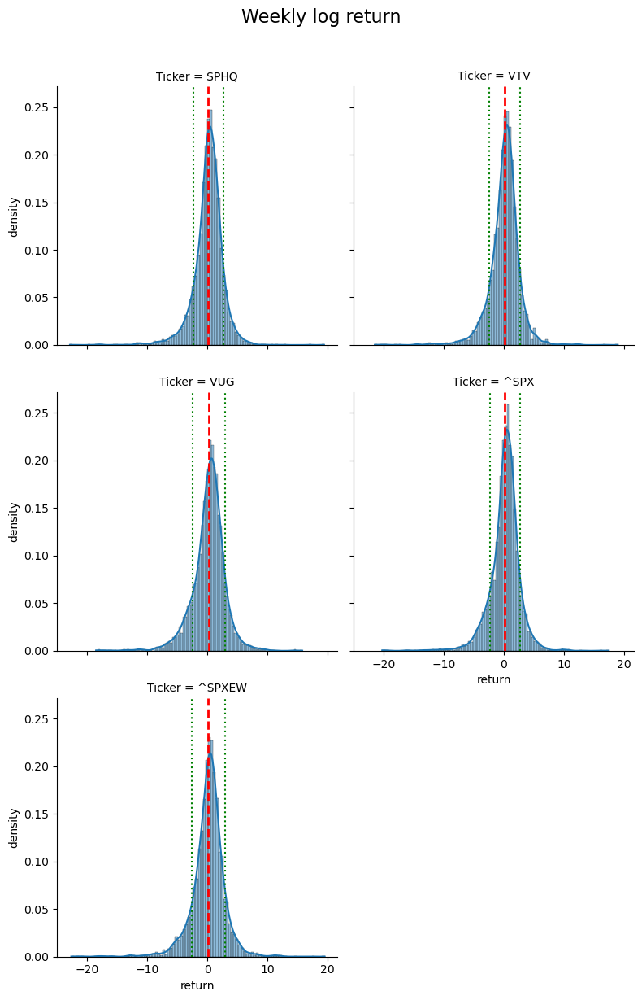

In [ ]:
# FacetGridを初期化し、ティッカーごとにグラフを分割
# col_wrap=2 で横に2つ並べるように指定
g = sns.FacetGrid(log_return_long, col="Ticker", col_wrap=2, height=4, sharex=True)

# 各グラフにヒストグラムをプロット
g.map(
    sns.histplot,
    "weekly_log_return",
    bins=100,
    kde=True,
    stat="density",
    edgecolor="black",
)

# 各サブプロットに平均値と±1シグマの垂直線を追加
for ax in g.axes.flatten():
    ticker = ax.get_title().split("=")[1].strip()

    # 該当ティッカーの統計量を取得
    mean_val = stats.loc[ticker, "log_return_avg(%)"]
    std_val = stats.loc[ticker, "log_return_std(%)"]

    # 平均 (µ) の線
    ax.axvline(
        mean_val,
        color="red",
        linestyle="--",
        linewidth=2,
        label=f"Mean: {mean_val:.4f}",
    )

    # +1シグマ (µ + σ) の線
    ax.axvline(
        mean_val + std_val,
        color="green",
        linestyle=":",
        linewidth=1.5,
        label="+1 Sigma",
    )

    # -1シグマ (µ - σ) の線
    ax.axvline(
        mean_val - std_val,
        color="green",
        linestyle=":",
        linewidth=1.5,
        label="-1 Sigma",
    )

    # 凡例をプロットに追加（スペースがあれば）
    # ax.legend()

# レイアウトの調整
plt.suptitle("Weekly log return", y=1.02, fontsize=16)
g.set_axis_labels("return", "density")
g.tight_layout()
plt.show()


## S&P セクター別 ETF

-   SPDR


In [ ]:
session = curl_cffi.Session(impersonate="safari15_5")
ticker_list = " ".join(
    [
        "XLK",
        "XLF",
        "XLV",
        "XLY",
        "XLC",
        "XLI",
        "XLP",
        "XLE",
        "XLU",
        "XLRE",
        "XLB",
        "^SPX",
    ]
)
Tickers_obj = yf.Tickers(ticker_list, session=session)
data = (
    Tickers_obj.history(period="max", interval="1d")
    .stack()
    .reset_index()
    .rename(columns={"Date": "date"})
)
display(data)


[*********************100%***********************]  12 of 12 completed
/var/folders/zk/q607hs0d7bq__dhkk2wj7sq80000gn/T/ipykernel_79783/1630067349.py:21: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  .stack()


Price,date,Ticker,Capital Gains,Close,Dividends,High,Low,Open,Stock Splits,Volume
0,1927-12-30,^SPX,NaN,17.660000,0.0,17.660000,17.660000,17.660000,0.0,0.000000e+00
1,1928-01-03,^SPX,NaN,17.760000,0.0,17.760000,17.760000,17.760000,0.0,0.000000e+00
2,1928-01-04,^SPX,NaN,17.719999,0.0,17.719999,17.719999,17.719999,0.0,0.000000e+00
3,1928-01-05,^SPX,NaN,17.549999,0.0,17.549999,17.549999,17.549999,0.0,0.000000e+00
4,1928-01-06,^SPX,NaN,17.660000,0.0,17.660000,17.660000,17.660000,0.0,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...
89458,2025-09-25,XLRE,0.0,41.470001,0.0,41.764999,41.445000,41.619999,0.0,3.559100e+06
89459,2025-09-25,XLU,0.0,85.419998,0.0,86.349998,85.419998,86.169998,0.0,9.344800e+06
89460,2025-09-25,XLV,0.0,134.130005,0.0,136.179993,133.729996,136.130005,0.0,1.409240e+07
89461,2025-09-25,XLY,0.0,236.220001,0.0,238.199997,235.149994,238.110001,0.0,5.793200e+06


In [ ]:
stock = yf.Ticker("MSFT")
earnings_info = stock.calendar
display(earnings_info)
historical_earnings = stock.get_earnings_dates()
display(historical_earnings)


{'Dividend Date': datetime.date(2025, 12, 11),
 'Ex-Dividend Date': datetime.date(2025, 11, 20),
 'Earnings Date': [datetime.date(2025, 10, 30)],
 'Earnings High': 4.02,
 'Earnings Low': 3.5,
 'Earnings Average': 3.67175,
 'Revenue High': 76548000000,
 'Revenue Low': 75000000000,
 'Revenue Average': 75487289950}

,EPS Estimate,Reported EPS,Surprise(%)
Earnings Date,,,
2025-10-29 16:00:00-04:00,3.66,NaN,NaN
2025-07-30 16:00:00-04:00,3.38,3.65,8.09
2025-04-30 16:00:00-04:00,3.22,3.46,7.59
2025-01-29 16:00:00-05:00,3.10,3.23,4.06
2024-10-30 16:00:00-04:00,3.11,3.30,6.25
2024-07-30 16:00:00-04:00,2.94,2.95,0.23
2024-04-25 16:00:00-04:00,2.84,2.94,3.40
2024-01-30 16:00:00-05:00,2.77,2.93,5.95
2023-10-24 16:00:00-04:00,2.65,2.99,12.85
